  Using cached python_docx-1.1.2-py3-none-any.whl (244 kB)


Saving Biz Processed.xlsx to Biz Processed.xlsx
Saving processed_Arts Data.xlsx to processed_Arts Data.xlsx
Saving processed_Med Data.xlsx to processed_Med Data.xlsx
Saving processed_Phy and math Data.xlsx to processed_Phy and math Data.xlsx
Saving processed_Soc Data.xlsx to processed_Soc Data.xlsx
Saving processed_Chem Data.xlsx to processed_Chem Data.xlsx
Saving processed_ECS Data.xlsx to processed_ECS Data.xlsx
Saving processed_Life Data.xlsx to processed_Life Data.xlsx


<ipython-input-2-f42e4761952c>:190: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


AttributeError: 'list' object has no attribute 'download'

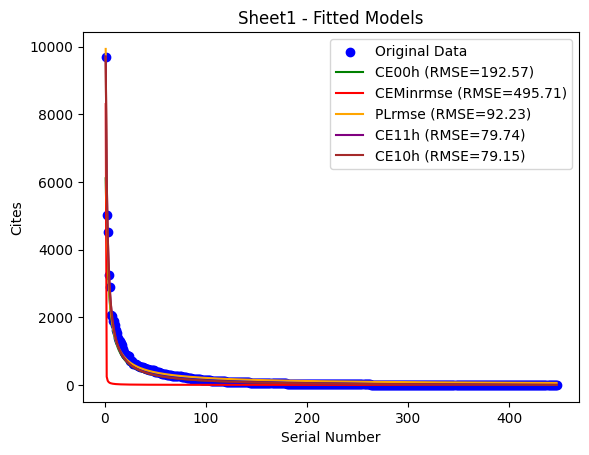

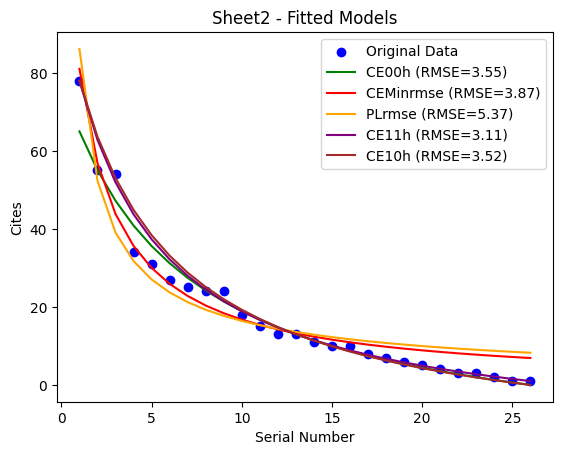

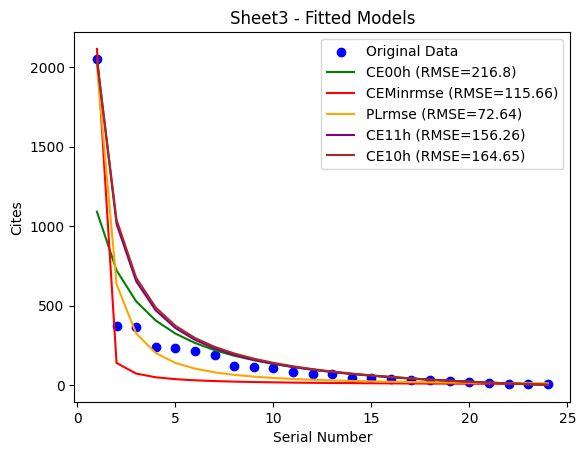

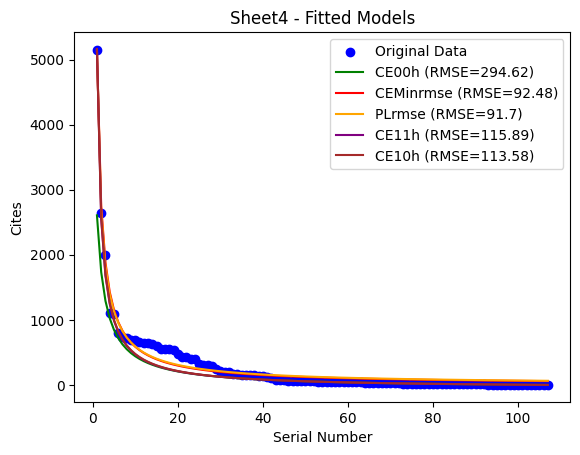

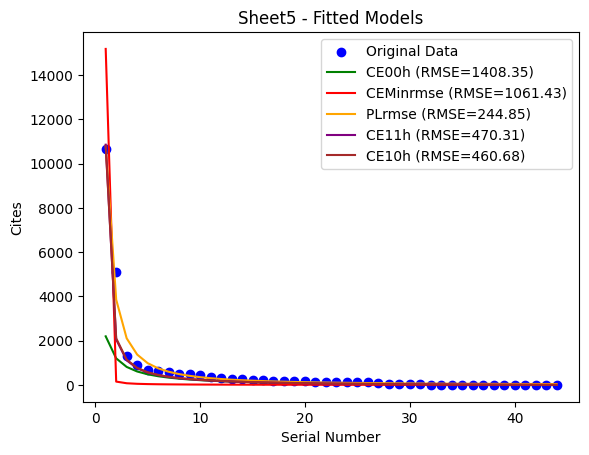

...

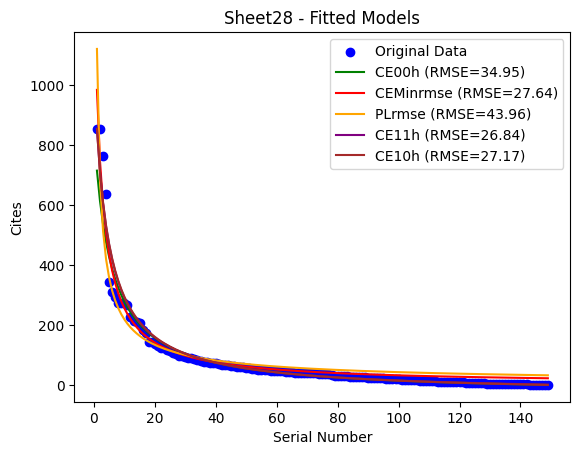

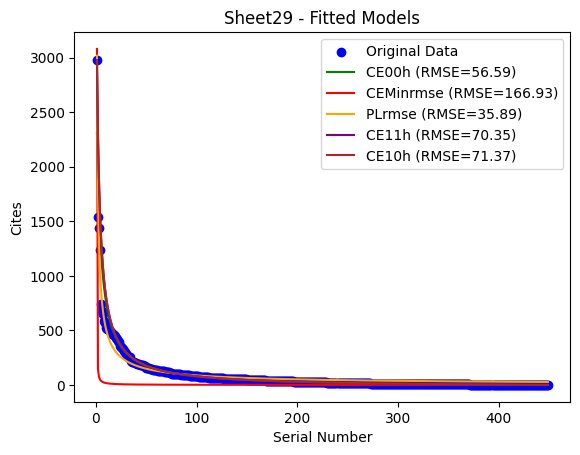

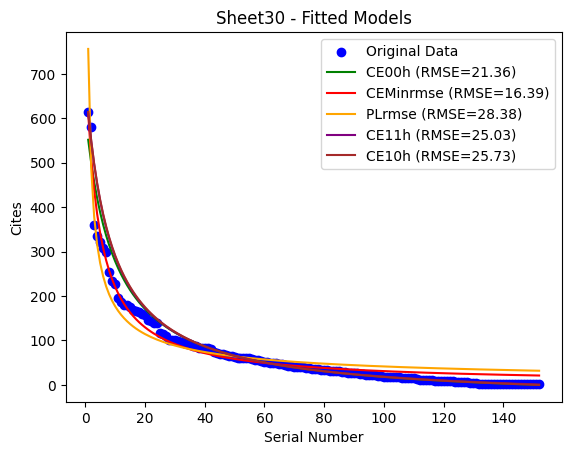

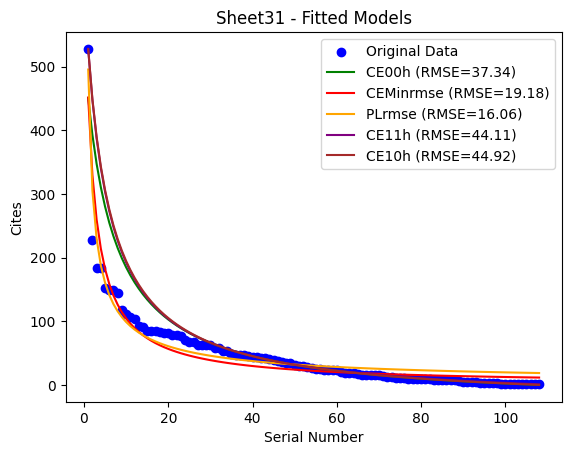

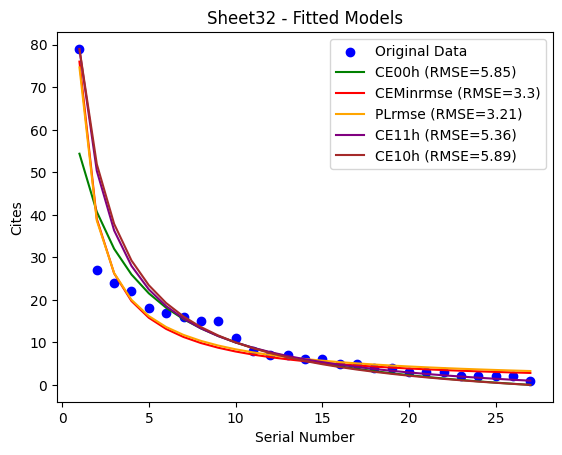

In [2]:
!pip install pandas numpy matplotlib python-docx scipy openpyxl

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from docx import Document
from docx.shared import Inches
from scipy.optimize import minimize
import zipfile
import os
from google.colab import files

# File upload in Google Colab
uploaded = files.upload()

if not os.path.exists('plots'):
    os.makedirs('plots')
if not os.path.exists('excels'):
    os.makedirs('excels')

def calculate_h_index(y_data):
    sorted_cites = np.sort(y_data)[::-1]
    h_index = np.max(np.where(sorted_cites >= np.arange(1, len(sorted_cites) + 1))[0]) + 1
    return h_index

def calculate_abc(M, N, h):
    a = (M * h**2) / (M * N - (M + N) * h)
    b = (M * N * (M - h) * (N - h)) * (h / (M * N - (M + N) * h))**2
    c = (N * h**2) / (M * N - (M + N) * h)
    return round(a, 2), round(b, 2), round(c, 2)

def calculate_abc_h_formula(M, N, h):
    a = -(-M*N + M*h**2 - M*h + M + N*h - h**2)/(-M*N + M*h + N*h - 2*h + 1)
    c = -(-M*N + M*h + N*h**2 - N*h + N - h**2)/(-M*N + M*h + N*h - 2*h + 1)
    b = (-M + h)*(M - 1)*(-N + h)*(N - 1)*(h - 1)**2/(-M*N + M*h + N*h - 2*h + 1)**2
    return round(a, 2), round(b, 2), round(c, 2)

def calculate_abc_10h(M, N, h):
    a = -M * h * (h - 1) / (-M * N + M * h + N * h - h)
    b = M * h * (-M + h) * (-N + h) * (N - 1) * (h - 1) / (-M * N + M * h + N * h - h)**2
    c = -(-M * N + M * h + N * h**2 - h**2) / (-M * N + M * h + N * h - h)
    return round(a, 2), round(b, 2), round(c, 2)

def calculate_rmse(y_true, y_pred):
    return round(np.sqrt(np.mean((y_true - y_pred) ** 2)), 2)

def optimize_abc(x_data, y_data):
    def objective(params):
        a, b, c = params
        fitted_values = (b / (x_data + c)) - a
        return calculate_rmse(y_data, fitted_values)

    initial_guess = [0.1, 100, 72]
    result = minimize(objective, initial_guess, method='Nelder-Mead')
    return [round(param, 2) for param in result.x]

def optimize_power_law(x_data, y_data):
    def objective(params):
        C, lam = params
        fitted_values = C / (x_data ** lam)
        return calculate_rmse(y_data, fitted_values)

    initial_guess = [np.max(y_data), 1]
    result = minimize(objective, initial_guess, method='Nelder-Mead')
    return [round(param, 2) for param in result.x]

fitted_values_df = pd.DataFrame(columns=['File Name', 'Sheet Name', 'Model', 'Serial Number', 'Fitted Value'])

for file_name, file_data in uploaded.items():
    xls = pd.ExcelFile(file_name)

    doc = Document()
    doc.add_heading('Plots for Each Sheet', 0)

    original_model_df = pd.DataFrame(columns=['Sheet', 'Model Parameters'])
    optimized_model_df = pd.DataFrame(columns=['Sheet', 'Model Parameters'])
    power_law_model_df = pd.DataFrame(columns=['Sheet', 'Model Parameters'])
    h_formula_model_df = pd.DataFrame(columns=['Sheet', 'Model Parameters'])
    abc10h_model_df = pd.DataFrame(columns=['Sheet', 'Model Parameters'])

    for sheet_name in xls.sheet_names:
        df = pd.read_excel(xls, sheet_name=sheet_name)
        x_data = df['Serial Number'].values
        y_data = df['ECC'].values

        M = np.max(y_data)
        N = len(y_data)
        h = calculate_h_index(y_data)

        a, b, c = calculate_abc(M, N, h)
        fitted_values = (b / (x_data + c)) - a
        rmse_original = calculate_rmse(y_data, fitted_values)

        for x, fitted_value in zip(x_data, fitted_values):
            new_row = pd.DataFrame({
                'File Name': [file_name],
                'Sheet Name': [sheet_name],
                'Model': ['CE00h'],
                'Serial Number': [x],
                'Fitted Value': [fitted_value]
            })
            fitted_values_df = pd.concat([fitted_values_df, new_row], ignore_index=True)

        a_opt, b_opt, c_opt = optimize_abc(x_data, y_data)
        fitted_values_opt = (b_opt / (x_data + c_opt)) - a_opt
        rmse_eqn2 = calculate_rmse(y_data, fitted_values_opt)

        for x, fitted_value in zip(x_data, fitted_values_opt):
            new_row = pd.DataFrame({
                'File Name': [file_name],
                'Sheet Name': [sheet_name],
                'Model': ['CEMinRMSE'],
                'Serial Number': [x],
                'Fitted Value': [fitted_value]
            })
            fitted_values_df = pd.concat([fitted_values_df, new_row], ignore_index=True)

        C_opt, lambda_opt = optimize_power_law(x_data, y_data)
        fitted_values_power_law = C_opt / (x_data ** lambda_opt)
        rmse_power_law = calculate_rmse(y_data, fitted_values_power_law)

        for x, fitted_value in zip(x_data, fitted_values_power_law):
            new_row = pd.DataFrame({
                'File Name': [file_name],
                'Sheet Name': [sheet_name],
                'Model': ['Power Law Model Min RMSE'],
                'Serial Number': [x],
                'Fitted Value': [fitted_value]
            })
            fitted_values_df = pd.concat([fitted_values_df, new_row], ignore_index=True)

        a_h, b_h, c_h = calculate_abc_h_formula(M, N, h)
        fitted_values_h = (b_h / (x_data + c_h)) - a_h
        rmse_h = calculate_rmse(y_data, fitted_values_h)

        for x, fitted_value in zip(x_data, fitted_values_h):
            new_row = pd.DataFrame({
                'File Name': [file_name],
                'Sheet Name': [sheet_name],
                'Model': ['CE11h'],
                'Serial Number': [x],
                'Fitted Value': [fitted_value]
            })
            fitted_values_df = pd.concat([fitted_values_df, new_row], ignore_index=True)

        a_10h, b_10h, c_10h = calculate_abc_10h(M, N, h)
        fitted_values_10h = (b_10h / (x_data + c_10h)) - a_10h
        rmse_10h = calculate_rmse(y_data, fitted_values_10h)

        for x, fitted_value in zip(x_data, fitted_values_10h):
            new_row = pd.DataFrame({
                'File Name': [file_name],
                'Sheet Name': [sheet_name],
                'Model': ['CE10h'],
                'Serial Number': [x],
                'Fitted Value': [fitted_value]
            })
            fitted_values_df = pd.concat([fitted_values_df, new_row], ignore_index=True)

        original_row = pd.DataFrame({
            'Sheet': [sheet_name],
            'Model Parameters': [f'{a},{b},{c},{rmse_original}']
        })
        original_model_df = pd.concat([original_model_df, original_row], ignore_index=True)

        optimized_row = pd.DataFrame({
            'Sheet': [sheet_name],
            'Model Parameters': [f'{a_opt},{b_opt},{c_opt},{rmse_eqn2}']
        })
        optimized_model_df = pd.concat([optimized_model_df, optimized_row], ignore_index=True)

        power_law_row = pd.DataFrame({
            'Sheet': [sheet_name],
            'Model Parameters': [f'{C_opt},{lambda_opt},{rmse_power_law}']
        })
        power_law_model_df = pd.concat([power_law_model_df, power_law_row], ignore_index=True)

        h_formula_row = pd.DataFrame({
            'Sheet': [sheet_name],
            'Model Parameters': [f'{a_h},{b_h},{c_h},{rmse_h}']
        })
        h_formula_model_df = pd.concat([h_formula_model_df, h_formula_row], ignore_index=True)

        abc10h_row = pd.DataFrame({
            'Sheet': [sheet_name],
            'Model Parameters': [f'{a_10h},{b_10h},{c_10h},{rmse_10h}']
        })
        abc10h_model_df = pd.concat([abc10h_model_df, abc10h_row], ignore_index=True)

        plt.figure()
        plt.scatter(x_data, y_data, label='Original Data', color='blue')
        plt.plot(x_data, fitted_values, label=f'CE00h (RMSE={rmse_original})', color='green')
        plt.plot(x_data, fitted_values_opt, label=f'CEMinrmse (RMSE={rmse_eqn2})', color='red')
        plt.plot(x_data, fitted_values_power_law, label=f'PLrmse (RMSE={rmse_power_law})', color='orange')
        plt.plot(x_data, fitted_values_h, label=f'CE11h (RMSE={rmse_h})', color='purple')
        plt.plot(x_data, fitted_values_10h, label=f'CE10h (RMSE={rmse_10h})', color='brown')
        plt.xlabel('Serial Number')
        plt.ylabel('Cites')
        plt.legend()
        plt.title(f'{sheet_name} - Fitted Models')
        plot_path = f'plots/{file_name[:-5]}_{sheet_name}.png'
        plt.savefig(plot_path)

        doc.add_heading(sheet_name, level=1)
        doc.add_picture(plot_path, width=Inches(6))
        doc.add_paragraph(f'Model Parameters (CE00h): a={a}, b={b}, c={c}, RMSE={rmse_original}')
        doc.add_paragraph(f'Model Parameters (CEMinRMSE): a={a_opt}, b={b_opt}, c={c_opt}, RMSE={rmse_eqn2}')
        doc.add_paragraph(f'Model Parameters (PoLminRMSE): C={C_opt}, lambda={lambda_opt}, RMSE={rmse_power_law}')
        doc.add_paragraph(f'Model Parameters (CE11h): a={a_h}, b={b_h}, c={c_h}, RMSE={rmse_h}')
        doc.add_paragraph(f'Model Parameters (CE10h): a={a_10h}, b={b_10h}, c={c_10h}, RMSE={rmse_10h}')

    original_model_df.to_excel(f'excels/{file_name[:-5]}_CE00h.xlsx', index=False)
    optimized_model_df.to_excel(f'excels/{file_name[:-5]}_CEMinRMSE.xlsx', index=False)
    power_law_model_df.to_excel(f'excels/{file_name[:-5]}_PLMinrmse.xlsx', index=False)
    h_formula_model_df.to_excel(f'excels/{file_name[:-5]}_CE11h.xlsx', index=False)
    abc10h_model_df.to_excel(f'excels/{file_name[:-5]}_CE10h.xlsx', index=False)

    doc.save(f'excels/{file_name[:-5]}_Plots.docx')

with zipfile.ZipFile('/content/plots_and_excels.zip', 'w') as zipf:
    for root, _, files in os.walk('plots'):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), 'plots'))
    for root, _, files in os.walk('excels'):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), 'excels'))

files.download('/content/plots_and_excels.zip')


In [4]:
!zip -r excels.zip excels

  adding: excels/ (stored 0%)
  adding: excels/processed_Life Data_PLMinrmse.xlsx (deflated 10%)
  adding: excels/processed_Soc Data_Plots.docx (deflated 0%)
  adding: excels/Biz Processed_PLMinrmse.xlsx (deflated 10%)
  adding: excels/processed_Arts Data_Plots.docx (deflated 0%)
  adding: excels/processed_Arts Data_CE00h.xlsx (deflated 10%)
  adding: excels/processed_Med Data_CE10h.xlsx (deflated 10%)
  adding: excels/processed_Chem Data_CE10h.xlsx (deflated 10%)
  adding: excels/processed_Med Data_CEMinRMSE.xlsx (deflated 10%)
  adding: excels/processed_Life Data_CE00h.xlsx (deflated 10%)
  adding: excels/Biz Processed_Plots.docx (deflated 0%)
  adding: excels/processed_Chem Data_PLMinrmse.xlsx (deflated 10%)
  adding: excels/processed_Arts Data_PLMinrmse.xlsx (deflated 10%)
  adding: excels/processed_Med Data_Plots.docx (deflated 0%)
  adding: excels/processed_Life Data_CE11h.xlsx (deflated 10%)
  adding: excels/processed_Phy and math Data_PLMinrmse.xlsx (deflated 10%)
  adding: exc